### Importing Necessary Libraries

In [65]:
import os
from PIL import Image
from directory_tree import display_tree

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import tensorflow as tf

## Train Data

The training data consists of $16000$ images along with their labels.

In [13]:
labels = pd.read_csv("./Data/train_labels.csv")
images = [str(name)+'.tif' for name in labels['id']]
labels['images'] = images
labels = labels[['id', 'images', 'label']]
labels

,id,images,label
0,0,0.tif,1
1,1,1.tif,13
2,2,2.tif,13
3,3,3.tif,14
4,4,4.tif,6
...,...,...,...
15995,15995,15995.tif,2
15996,15996,15996.tif,15
15997,15997,15997.tif,3
15998,15998,15998.tif,9


The labels are ranging from $0-15$ for the following mentioned document types.

In [42]:
class_labels = list(set(labels['label']))
class_names = [
    'letter', 'form', 'email', 'handwritten', 'advertisement', 'scientific report', 'scientific publication',
    'specification', 'file folder', 'news article', 'budget', 'invoice', 'presentation', 'questionnaire', 'resume',
    'memo'
]
label_names = pd.DataFrame({
    'labels': class_labels,
    'names': class_names
})
label_names

,labels,names
0,0,letter
1,1,form
2,2,email
3,3,handwritten
4,4,advertisement
5,5,scientific report
6,6,scientific publication
7,7,specification
8,8,file folder
9,9,news article


There is no class imbalance in the training dataset and each class is well represented with $\sim 1000$ images per class label.

In [43]:
pd.value_counts(labels['label'])

8     1059
6     1044
0     1032
12    1020
5     1012
11    1011
13    1007
9     1000
3      993
14     992
15     988
10     974
1      969
2      968
4      966
7      965
Name: label, dtype: int64

Let's take a look at the document images for each class to get an idea of what sort of documents and their images we are dealing with.

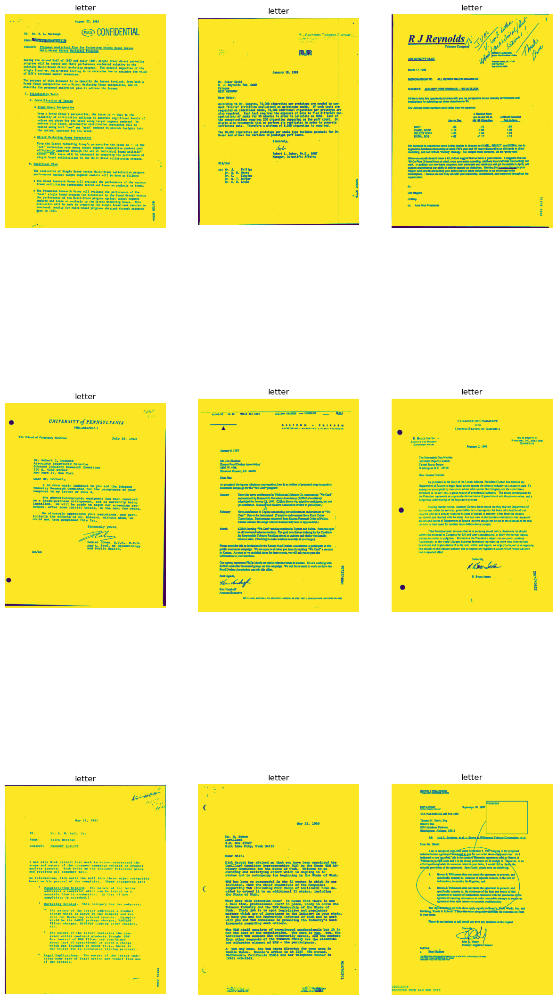

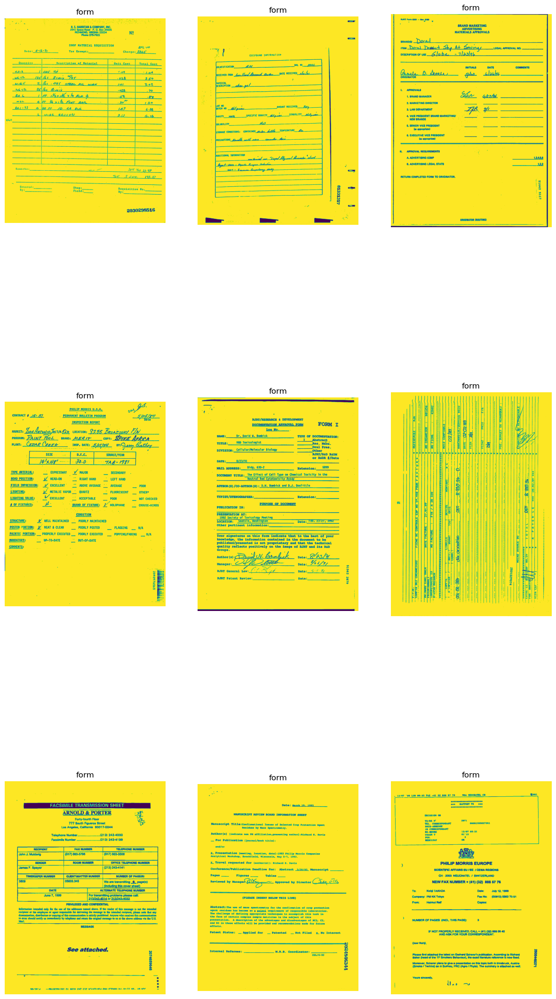

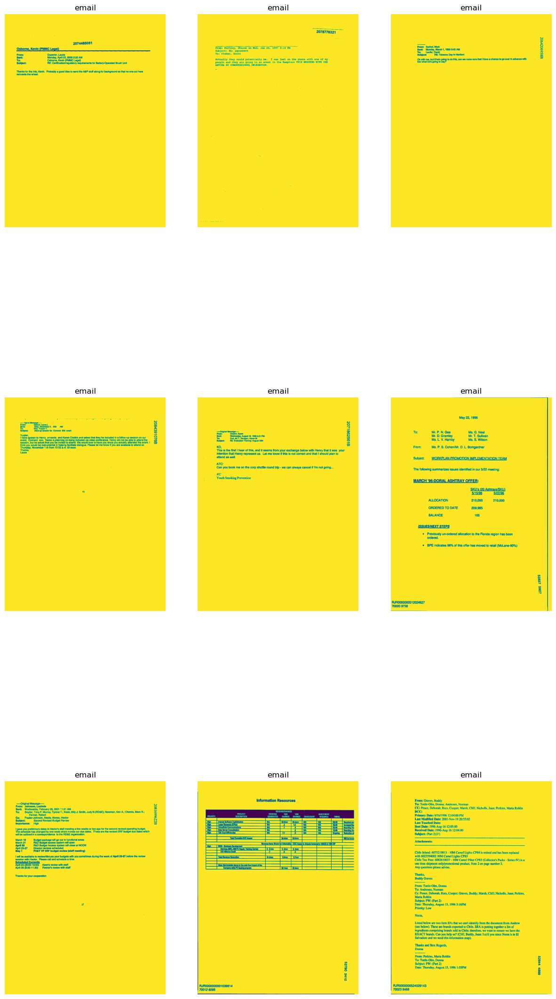

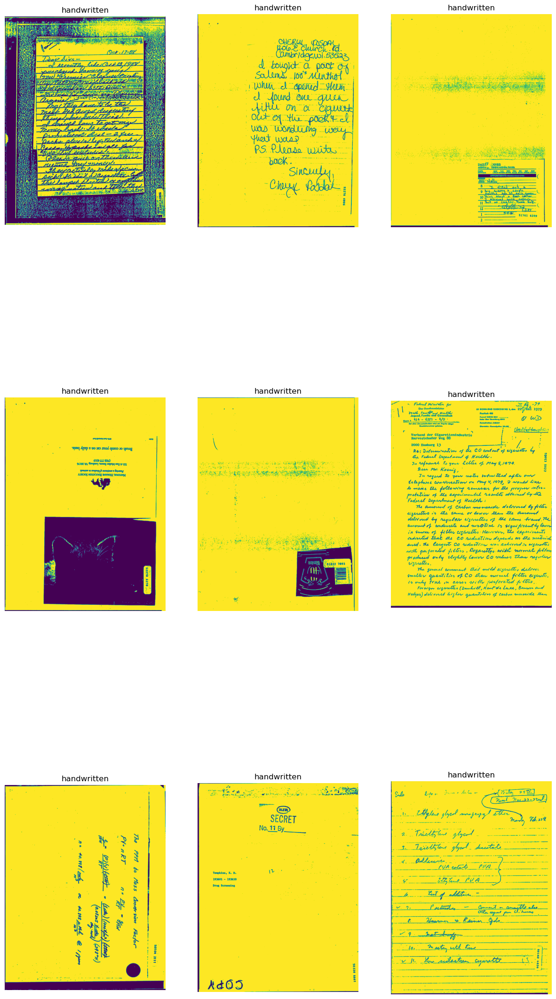

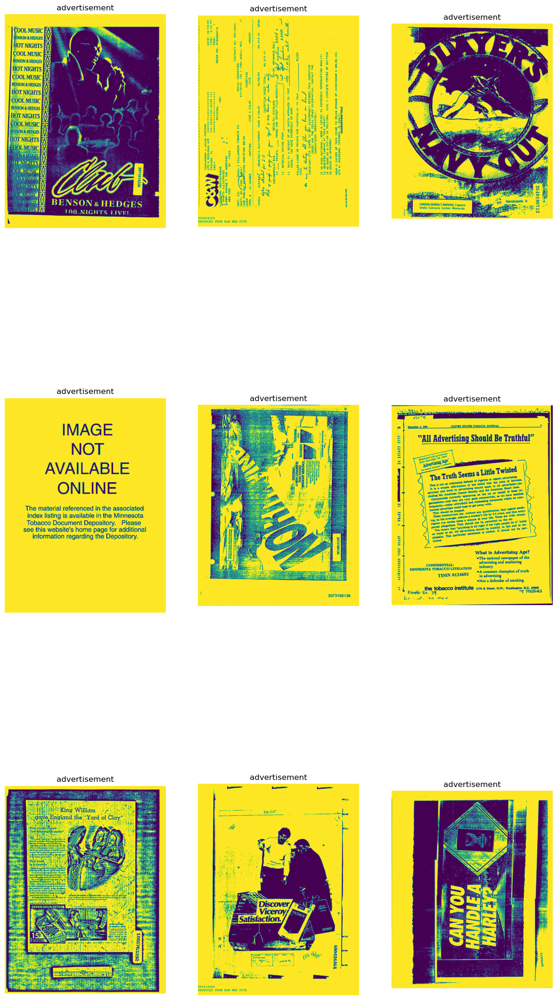

...

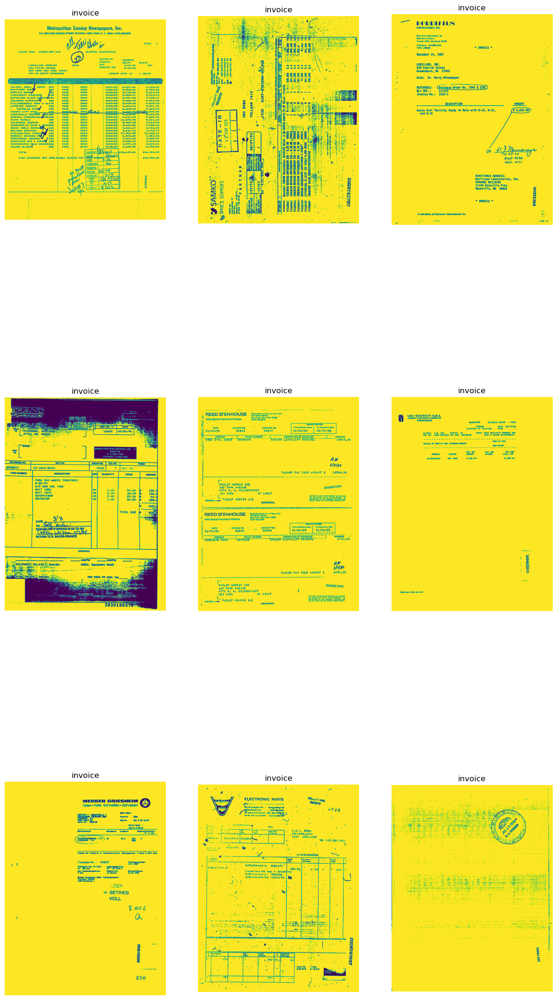

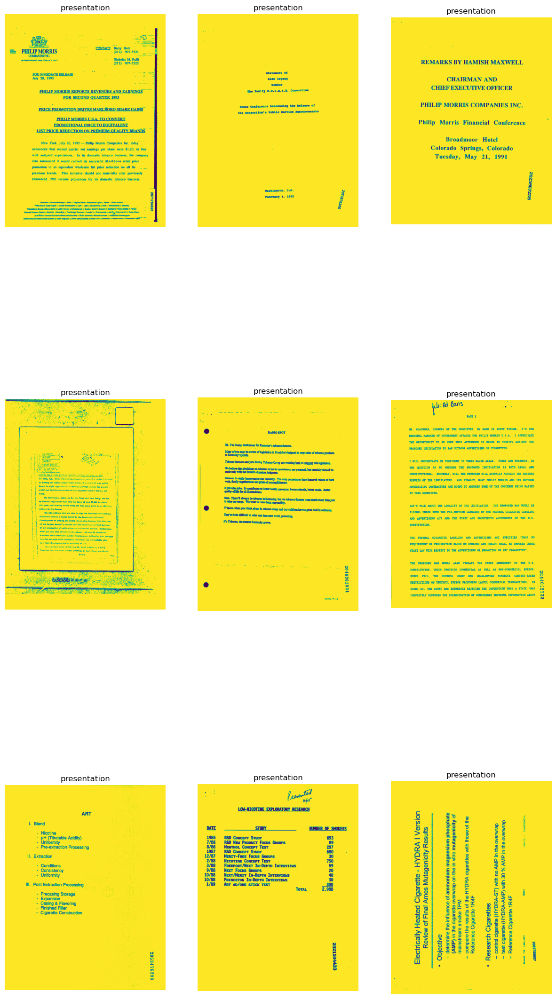

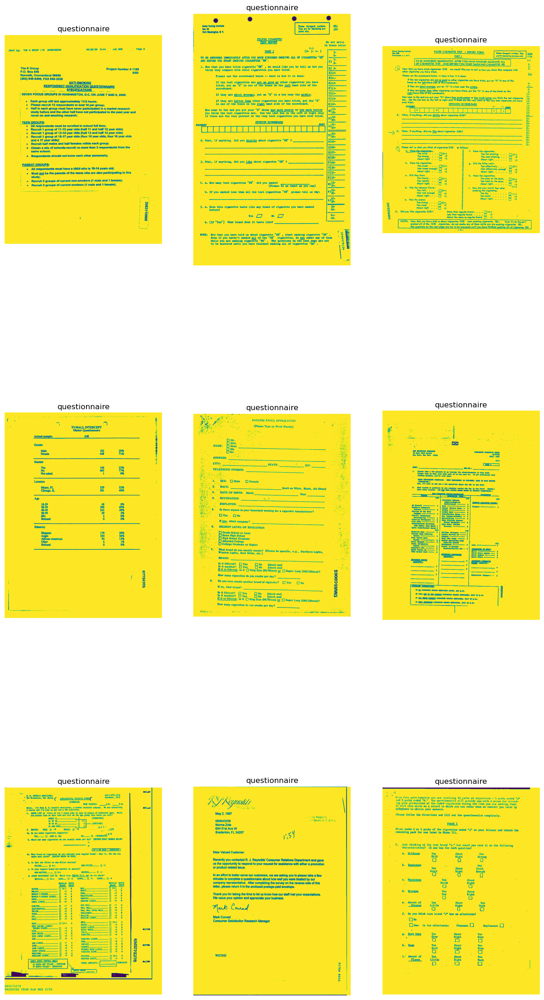

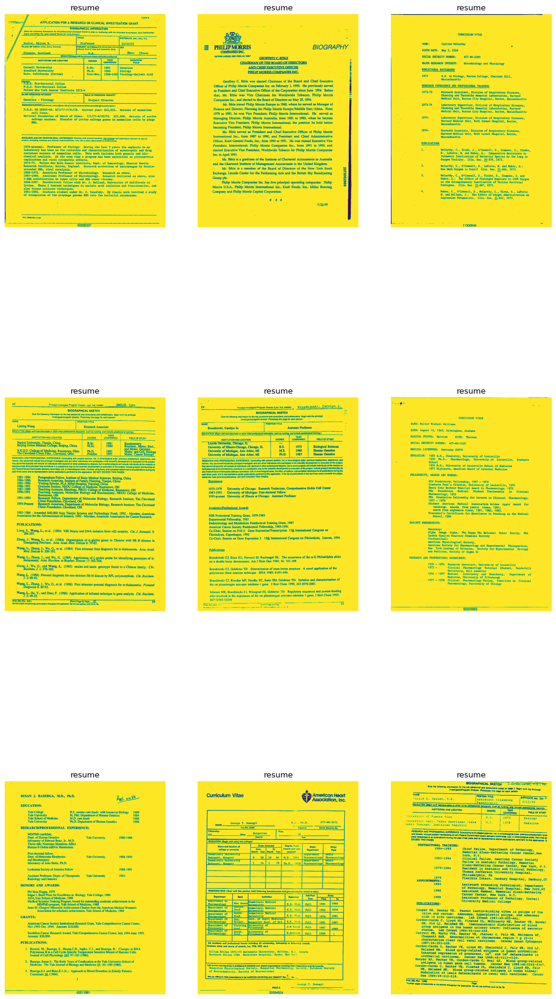

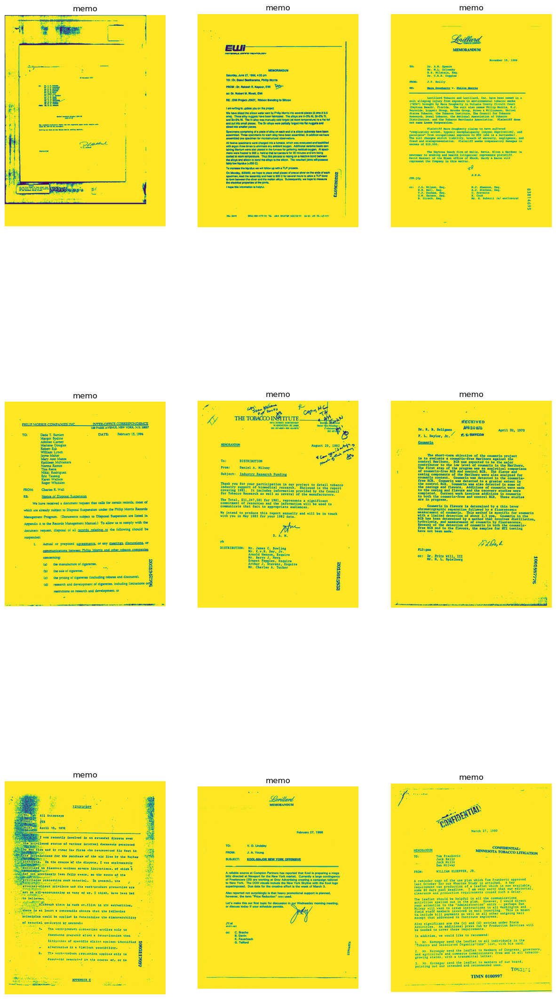

In [82]:
for i in range(len(class_labels)):
    fig, ax = plt.subplots(3, 3)
    fig.set_figheight(30)
    fig.set_figwidth(15)
    imgs = [plt.imread(f'./Data/train/train/{name}') for name in list(labels[labels.label == i][:9]['images'])]
    m = 0
    for j in range(3):
        for k in range(3):
            ax[j, k].imshow(imgs[m])
            ax[j, k].axis('off')
            ax[j, k].set_title(class_names[i])
            m += 1

It is evident that there are wrongly labeled images. Let's look at few images from validation set.

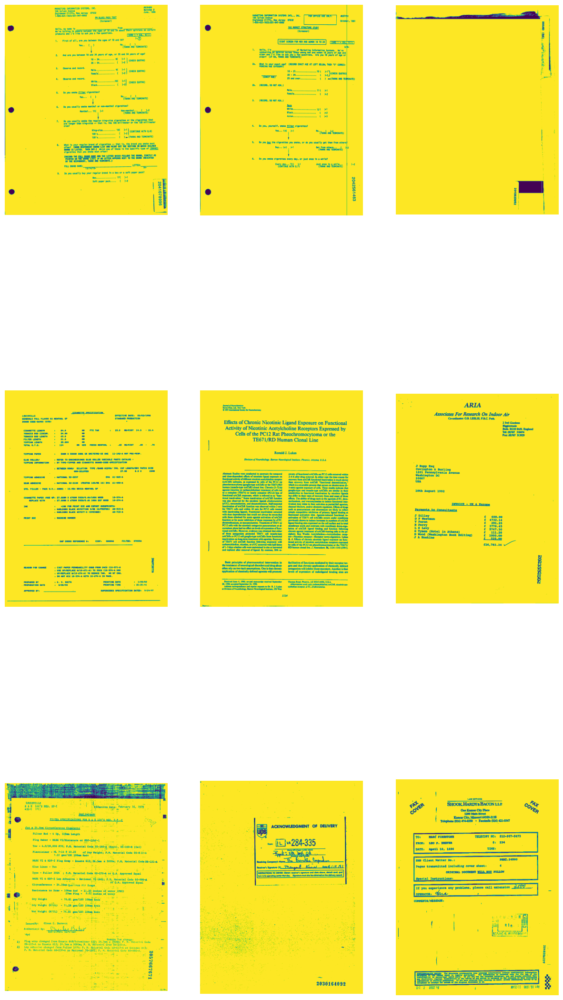

In [45]:
fig, ax = plt.subplots(3, 3)
fig.set_figheight(30)
fig.set_figwidth(15)
imgs = [plt.imread('./Data/validation/validation/'+name) for name in os.listdir('./Data/validation/validation')[:9]]
m = 0
for j in range(3):
    for k in range(3):
        ax[j, k].imshow(imgs[m])
        ax[j, k].axis('off')
        m += 1

## Data Preparation

Since, there is a lot of image data instead of using the whole data at once in a tensor form, we would be using a data generator to prevent memory issues.

In [75]:
imgs = [plt.imread('./Data/validation/validation/'+name) for name in os.listdir('./Data/validation/validation/')]
heights = [img.shape[0] for img in imgs]
widths = [img.shape[1] for img in imgs]
print("")
print("Mean Image Height:", np.mean(heights))
print("Mean Image Width:", np.mean(widths))
print("Min Image Height:", np.min(heights))
print("Min Image Width:", np.min(widths))

Mean Image Height: 1000.0
Mean Image Width: 766.5088888888889
Min Image Height: 1000
Min Image Width: 611


Since, the Keras own data generator does not support TIFF images, we resort to writing our own custom data generator.

In [ ]:
# class ImageDataGenerator(tf.ker)